In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from shapely.geometry import Point
import seaborn as sns
import numpy as np
import os
FIG_PATH = "C:/Users/718/Desktop/cse163/"



In [2]:
# First to read data, you need change the file path to whather in your laptop
# use cse 163 environment so that all the package is install, more details in https://courses.cs.washington.edu/courses/cse163/software/ 
Crime_FILE_PATH = "C:/Users/718/Desktop/cse163/crime_in_la.csv"
LA_FILE_PATH = "C:/Users/718/Desktop/cse163/LAPD_map/LAPD_Divisions.shp"
la_crime_data = pd.read_csv(Crime_FILE_PATH)
la_crime_data = la_crime_data.loc[la_crime_data["LAT"] != 0]
geometry = [Point(xy) for xy in zip(la_crime_data['LON'], la_crime_data['LAT'])]
la_crime_data = gpd.GeoDataFrame(la_crime_data, geometry=geometry)

In [3]:
la_crime_data.head()

,DR_NO,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,...,Vict Descent,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,LOCATION,LAT,LON,geometry
0,10304468,08/01/2020,22:30,3,Southwest,377,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,...,B,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978,POINT (-118.29780 34.01410)
1,190101086,01/01/2020,03:30,1,Central,163,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,...,H,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545,POINT (-118.25450 34.04590)
2,191501505,01/01/2020,17:30,15,N Hollywood,1543,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,...,W,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,POINT (-118.40190 34.16850)
3,191921269,01/01/2020,04:15,19,Mission,1998,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,...,X,BEAUTY SUPPLY STORE,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468,POINT (-118.44680 34.21980)
4,200100501,01/01/2020,00:30,1,Central,163,121,"RAPE, FORCIBLE",0413 1822 1262 1415,25,...,H,NIGHT CLUB (OPEN EVENINGS ONLY),500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S BROADWAY,34.0452,-118.2534,POINT (-118.25340 34.04520)


In [4]:
la_map = gpd.read_file(LA_FILE_PATH)
la_crime_data.crs = la_map.crs
# The area name in la_map is a little different with crime data. But we want those to match
# inorder to make some analysis, so we make change to let same area have same name.
# There is a test code to check if they match
la_map["APREC"] = la_map["APREC"].str.lower()
la_map["APREC"] = la_map["APREC"].replace(["north hollywood", "west los angeles"], ["n hollywood", "west la"])
la_crime_data["AREA NAME"] = la_crime_data["AREA NAME"].str.lower()
la_map.head()

,OBJECTID,APREC,PREC,AREA,PERIMETER,SHAPE_Leng,SHAPE_Area,geometry
0,1,mission,19,6.995826e+08,190817.495739,0.576177,0.006363,"POLYGON ((-118.50736 34.33464, -118.50381 34.3..."
1,2,devonshire,17,1.346816e+09,175591.702871,0.534007,0.012249,"POLYGON ((-118.50736 34.33464, -118.50668 34.3..."
2,3,foothill,16,1.297385e+09,203717.879169,0.627755,0.011797,"POLYGON ((-118.41581 34.29384, -118.41567 34.2..."
3,4,topanga,21,9.090326e+08,155505.795458,0.470165,0.008260,"POLYGON ((-118.63166 34.23858, -118.63151 34.2..."
4,5,west valley,10,9.364057e+08,136316.899694,0.407795,0.008507,"POLYGON ((-118.56229 34.22035, -118.56184 34.2..."


<AxesSubplot:>

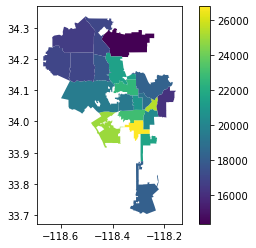

In [5]:
a = la_crime_data.groupby("AREA NAME", as_index=False).count()
a = a[["AREA NAME", "DR_NO"]]
merged = a.merge(la_map, left_on='AREA NAME', right_on='APREC')
merged.head()
merged = gpd.GeoDataFrame(merged, geometry="geometry")
merged.plot(column="DR_NO", legend=True)

<AxesSubplot:>

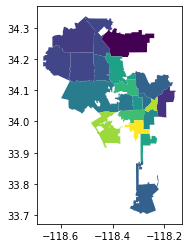

In [6]:
a = la_crime_data.groupby("AREA NAME", as_index=False).count()
a = a[["AREA NAME", "DR_NO"]]
merged = la_map.merge(a, left_on='APREC', right_on='AREA NAME')
type(merged)
merged.plot(column="DR_NO")

In [7]:
location_count = la_crime_data.groupby("Premis Desc", as_index=False).count()
location_count.sort_values(by=["DR_NO"], ascending=False, inplace=True)
location_count = location_count[["DR_NO", "Premis Desc"]].head(n=15)
location_count

,DR_NO,Premis Desc
264,107658,STREET
253,68069,SINGLE FAMILY DWELLING
205,49734,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)"
225,31256,PARKING LOT
216,19104,OTHER BUSINESS
252,18795,SIDEWALK
296,13834,"VEHICLE, PASSENGER/TRUCK"
79,9395,GARAGE/CARPORT
63,7926,DRIVEWAY
244,5168,RESTAURANT/FAST FOOD


<AxesSubplot:xlabel='TIME OCC', ylabel='Count'>

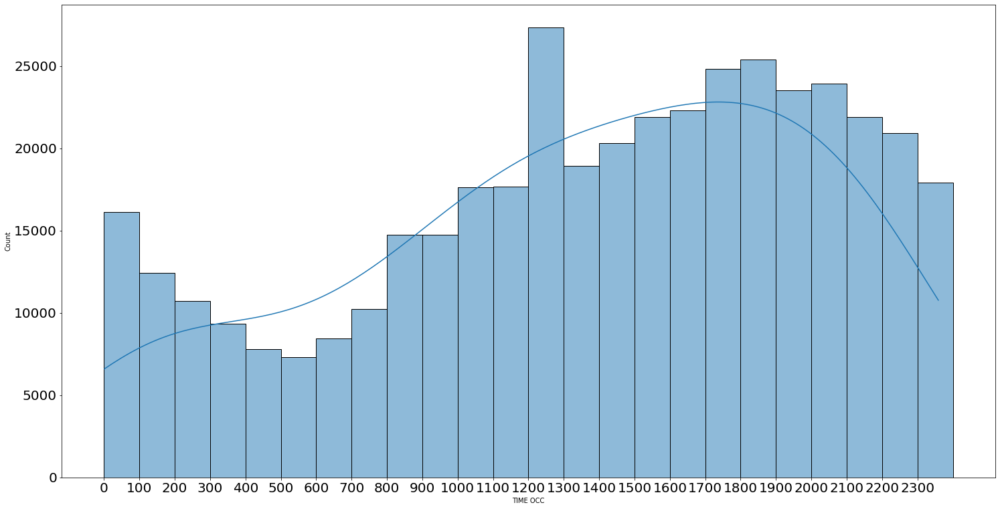

In [8]:
process_data = la_crime_data.groupby("TIME OCC", as_index=False).count()
process_data["TIME OCC"] = process_data["TIME OCC"].str.replace(":", "").astype(int)
plt.figure(figsize=(25,13))
plt.xticks(np.arange(0, 2400, 100), fontsize=20)
plt.yticks(fontsize=20)
sns.histplot(data=process_data, x="TIME OCC", weights="DR_NO", kde=True, binwidth=100, binrange=(0,2400))


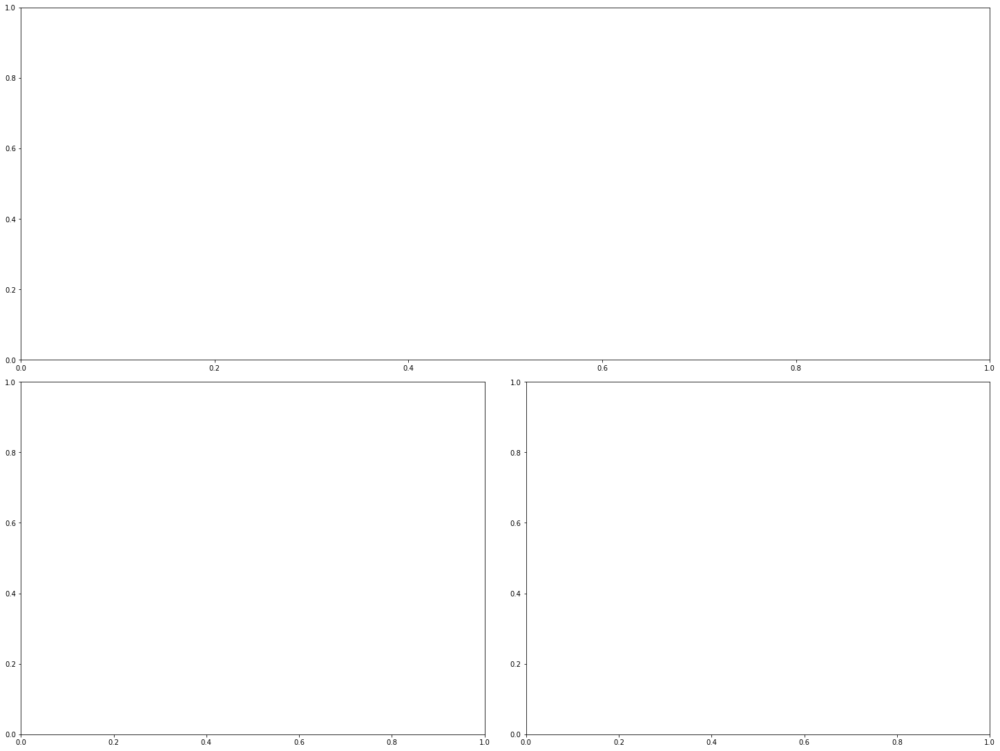

In [9]:
fig = plt.figure(figsize=(20, 15), constrained_layout=True)
spec = fig.add_gridspec(2, 2)

ax0 = fig.add_subplot(spec[0, :])

ax10 = fig.add_subplot(spec[1, 0])

ax11 = fig.add_subplot(spec[1, 1])



In [10]:
la_crime_data["count"] = 1
crime_count = gpd.sjoin(la_map, la_crime_data, how='inner', op='intersects')
crime_count = crime_count[["APREC", "count", "geometry"]]


<AxesSubplot:xlabel='Count', ylabel='Premis Desc'>

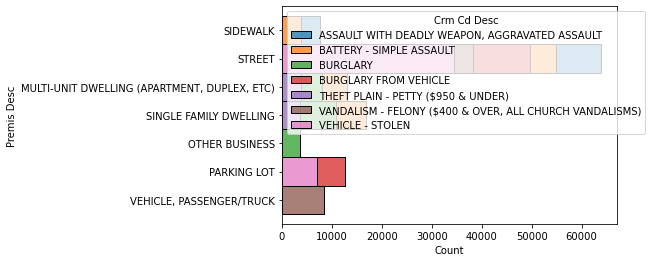

In [11]:
a = la_crime_data.groupby("Crm Cd Desc", as_index=False)["count"].sum()
a.sort_values(by=["count"], ascending=False, inplace=True)
b = a["Crm Cd Desc"].head(n=7)

crime_type_data = la_crime_data[la_crime_data["Crm Cd Desc"].isin(b.tolist())]
crime_type_data = crime_type_data.groupby(["Crm Cd Desc", "Premis Desc"], as_index=False).size()
crime_type_data = crime_type_data[crime_type_data["size"] > 3000]
sns.histplot(crime_type_data, weights="size", y="Premis Desc",
                         hue="Crm Cd Desc", multiple="stack")

In [12]:
wapon_data = la_crime_data[la_crime_data["Weapon Used Cd"] != 500.0]
wapon_data = gpd.sjoin(la_map, wapon_data, how='inner', op='intersects')
wapon_data = wapon_data[["geometry", "Weapon Desc", "count"]]
wapon_data

,geometry,Weapon Desc,count
0,"POLYGON ((-118.50736 34.33464, -118.50381 34.3...","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",1
0,"POLYGON ((-118.50736 34.33464, -118.50381 34.3...","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",1
0,"POLYGON ((-118.50736 34.33464, -118.50381 34.3...",FIRE,1
0,"POLYGON ((-118.50736 34.33464, -118.50381 34.3...","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",1
0,"POLYGON ((-118.50736 34.33464, -118.50381 34.3...",HAND GUN,1
...,...,...,...
20,"POLYGON ((-118.25196 34.07419, -118.25188 34.0...","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",1
20,"POLYGON ((-118.25196 34.07419, -118.25188 34.0...",HAND GUN,1
20,"POLYGON ((-118.25196 34.07419, -118.25188 34.0...","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",1
20,"POLYGON ((-118.25196 34.07419, -118.25188 34.0...",OTHER KNIFE,1


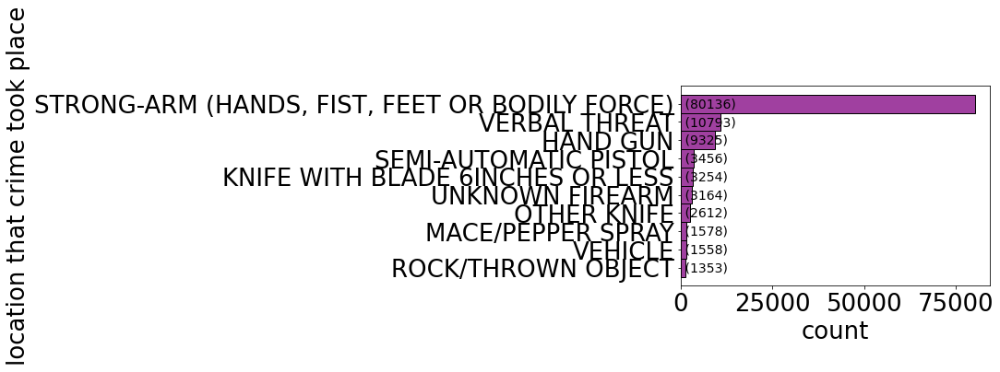

In [13]:
wapon_data = la_crime_data[la_crime_data["Weapon Used Cd"] != 500.0]
wapon_data = wapon_data.groupby("Weapon Desc", as_index=False)["count"].sum()
wapon_data.sort_values(by=["count"], ascending=False, inplace=True)
wapon_data = wapon_data.head(n=10)
graph = sns.histplot(data=wapon_data, y="Weapon Desc", weights="count", color="purple")
graph.tick_params(labelsize=26)
graph.set_xlabel("count",fontsize=26)
graph.set_ylabel("location that crime took place",fontsize=26)

labels = [f" ({i})" for i in wapon_data["count"].tolist()]
rects = graph.patches
for rect, label in zip(rects, labels):
    graph.text(
        -0.1, rect.get_y() + (rect.get_height() / 2 + 0.2), label, fontsize="14"
    )

In [14]:
wapon_strong_arm = la_crime_data[la_crime_data["Weapon Desc"] ==
                            "STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)"]
wapon_strong_arm = wapon_strong_arm.groupby("AREA NAME", as_index=False)["count"].sum()
wapon_strong_arm = la_map.merge(wapon_strong_arm, left_on="APREC", right_on="AREA NAME", how="inner")

wapon_pistol = la_crime_data[la_crime_data["Weapon Desc"].isin(["HAND GUN", "SEMI-AUTOMATIC PISTOL"])]
wapon_pistol = wapon_pistol.groupby("AREA NAME", as_index=False)["count"].sum()
wapon_pistol = la_map.merge(wapon_pistol, left_on="APREC", right_on="AREA NAME", how="inner")




<AxesSubplot:>

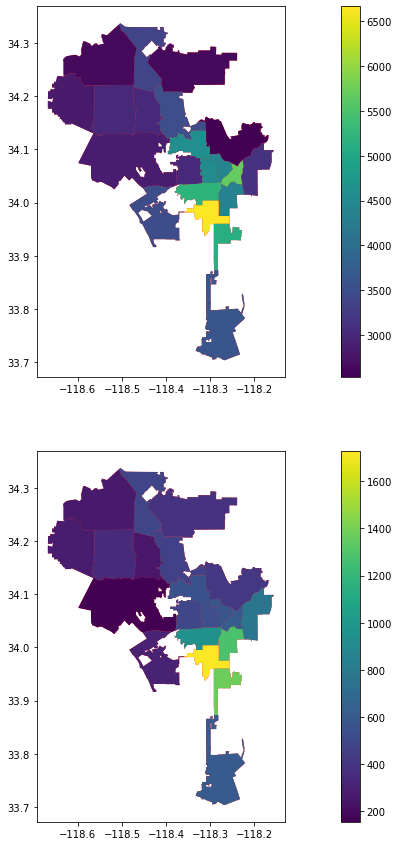

In [15]:
fig, ax = plt.subplots(2, figsize=(20, 15))
la_map.plot(ax=ax[0], color="red")
wapon_strong_arm.plot(column="count", ax=ax[0], legend=True)

la_map.plot(ax=ax[1], color="red")
wapon_pistol.plot(column="count", ax=ax[1], legend=True)

<AxesSubplot:xlabel='Vict Age', ylabel='Count'>

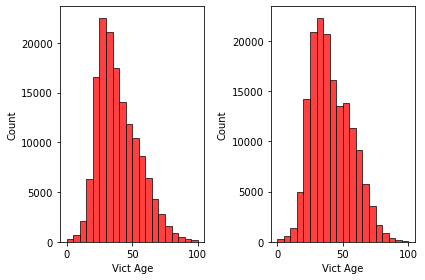

In [16]:
victims_m = la_crime_data[(la_crime_data["Vict Sex"] == "M") &
                         (la_crime_data["Vict Age"] > 0)]
victims_f = la_crime_data[(la_crime_data["Vict Sex"] == "F") &
                         (la_crime_data["Vict Age"] > 0)]
victims_f = victims_f.groupby("Vict Age", as_index=False)["count"].sum()
victims_m = victims_m.groupby("Vict Age", as_index=False)["count"].sum()
fig, ax = plt.subplots(1, 2, tight_layout=True)
sns.histplot(data=victims_f, x="Vict Age", weights="count",
             color="red", ax=ax[0], binwidth=5, binrange=(0,100))
sns.histplot(data=victims_m, x="Vict Age", weights="count",
             color="red", ax=ax[1], binwidth=5, binrange=(0,100))


In [17]:
la_crime_data["TIME OCC"] = la_crime_data["TIME OCC"]\
                            .str.replace(":", "").astype(int)

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB

ml_data = la_crime_data[["TIME OCC", "AREA", "Crm Cd", "Vict Age",
                "Vict Sex", "Vict Descent", "Weapon Used Cd", "Premis Desc"]]
ml_data = ml_data[ml_data["Vict Sex"] != "X"]
ml_data = ml_data[ml_data["Vict Age"] != "X"]
ml_data = ml_data[ml_data["Weapon Used Cd"] != 500.0]
ml_data = ml_data.dropna()
features = ml_data.loc[:, ml_data.columns != "AREA"]
features = pd.get_dummies(features)
labels = ml_data["AREA"]
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2)

In [19]:
import plotly.express as px
import plotly.offline as py
py.init_notebook_mode(connected=True)
victims = la_crime_data[(la_crime_data["Vict Sex"] != "X") &
                        (la_crime_data["Vict Age"] > 0) &
                        (la_crime_data["Vict Sex"] != "H")]


fig = px.histogram(victims, x="Vict Age", y="count",
             color="Vict Sex", barmode="group",
             height=400)
fig.update_layout(title_text="Count Crime by Victims Sex",
                  xaxis = dict(
                    tickmode = 'array',
                    tickvals = list(range(0, 100, 10))))
fig.show()

In [20]:
victims_f = victims_f.groupby("Vict Age", as_index=False)["count"].sum()
victims_m = victims_m.groupby("Vict Age", as_index=False)["count"].sum()

In [21]:
crime_count = la_crime_data.groupby("AREA NAME", as_index=False)["count"].sum()
crime_count = crime_count[["AREA NAME", "count"]]
location_count = la_crime_data.groupby("Premis Desc",
                                        as_index=False)["count"].sum()
location_count.sort_values(by=["count"], ascending=False, inplace=True)
location_count = location_count.head(n=15)
merged = la_map.merge(crime_count, left_on="APREC", right_on="AREA NAME", how="inner")

fig = px.choropleth_mapbox(merged, geojson=merged.geometry, locations=merged.index,
                    mapbox_style="open-street-map", color="count",
                    opacity=0.5, hover_data=["count", "AREA NAME"],
                    center={"lat": 34.0522, "lon": -118.2437},
                    title="Area Crime Density in Detail")

fig.show()

In [ ]:
wapon_strong_arm = la_crime_data[la_crime_data["Weapon Desc"] ==
    "STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)"]
wapon_strong_arm = wapon_strong_arm.groupby("AREA NAME",
                                            as_index=False)["count"].sum()
wapon_strong_arm = la_map.merge(wapon_strong_arm, left_on="APREC",
                                right_on="AREA NAME", how="inner")
# data involved pistol
wapon_pistol = la_crime_data[la_crime_data["Weapon Desc"].isin(
                            ["HAND GUN", "SEMI-AUTOMATIC PISTOL"])]
wapon_pistol = wapon_pistol.groupby("AREA NAME", as_index=False)["count"].sum()
wapon_pistol = la_map.merge(wapon_pistol, left_on="APREC",
                            right_on="AREA NAME", how="inner")


fig_arm = px.choropleth_mapbox(wapon_strong_arm, geojson=wapon_strong_arm.geometry,
                    locations=wapon_strong_arm.index,
                    mapbox_style="carto-positron", color="count",
                    opacity=0.7, hover_data=["count", "AREA NAME"],
                    center={"lat": 34.0522, "lon": -118.2437},
                    title="Distribution of crime invoded strong arm")

fig_arm.show()

In [ ]:
fig_pistol = px.choropleth_mapbox(wapon_pistol, geojson=wapon_pistol.geometry,
                    locations=wapon_pistol.index,
                    mapbox_style="carto-positron", color="count",
                    opacity=0.7, hover_data=["count", "AREA NAME"],
                    center={"lat": 34.0522, "lon": -118.2437},
                    title="Distribution of crime invoded strong arm",
                    width=1000, height=500)

fig_arm.show()

In [34]:
with open('p_graph.html', 'a') as f:
    f.write(fig_pistol.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(fig_arm.to_html(full_html=False, include_plotlyjs='cdn'))